<a href="https://colab.research.google.com/github/ilanb1/Coloring-IR-images/blob/main/ir2rgb_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Coloring Infrared (IR) images

In this notebook, we will try to apply the Pix2pix algorithm for coloring IR images.
IR images are single-channel images (black-and-white images), although the information in them is not the same as the black-and-white image that was converted from the original color image. Some of the information is lost, and some parts appear only in the IR image that cannot be seen even in the original color image.
Therefore, the transition IR_to_rgb is more difficult than BW_to_rgb.
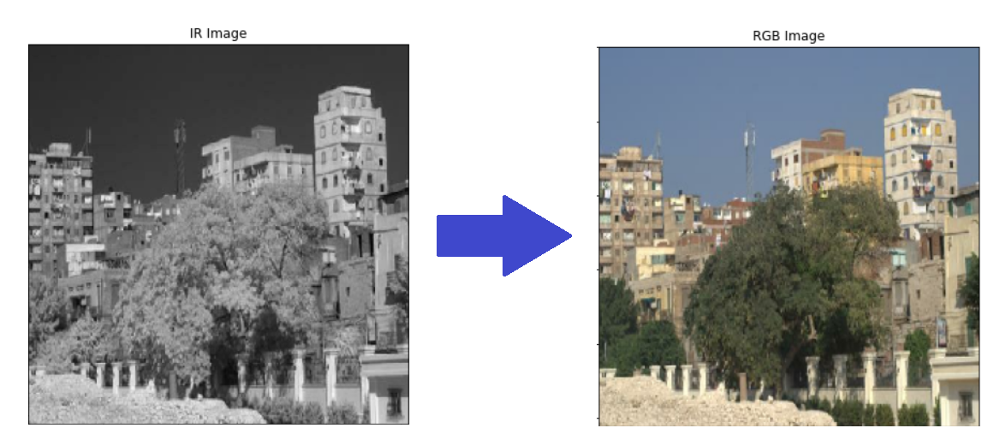

The implementation is according to the TensorFlow tutorial for pix2pix:
https://www.tensorflow.org/tutorials/generative/pix2pix?hl=en
with slight modifications to match the depth of our input (IR: single-channel) and output (ab channels of the Lab color space)

We will use the LAB color space instead of the RGB color space.

The basic idea: we will use the IR image as if it were the L channel of the original image.
This IR image will be the input to the generator.

We will train the generator to predict the a and b channels of the original image.

To create the final color image: we will concatenate the ab channels that the generator predicts, with the IR image (which serves the role of the L channel).



importing libraries:


In [1]:
!pip install -q tensorflow-io

import tensorflow as tf
import tensorflow_io as tfio
import matplotlib.pyplot as plt
import os
import numpy as np
import time
from IPython import display

     |████████████████████████████████| 23.4 MB 1.4 MB/s 


mounting to google drive:

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Creating the training and validation datasets from the folder in my google drive.
The images were downloaded from: 
https://ivrlwww.epfl.ch/supplementary_material/cvpr11/index.html

In [3]:
image_height = 798
image_width = 1182
images_path = '/content/drive/MyDrive/IR dataset/IR project/cleaned data set'

training_ds = tf.keras.utils.image_dataset_from_directory(
    directory = images_path,
    labels=None,
    label_mode=None,
    batch_size=None,
    image_size=(image_height, image_width),
    shuffle=True,
    seed=119,
    validation_split=0.1,
    subset="training",
)

validation_ds = tf.keras.utils.image_dataset_from_directory(
    directory = images_path,
    labels=None,
    label_mode=None,
    batch_size=None,
    image_size=(image_height, image_width),
    shuffle=True,
    seed=119,
    validation_split=0.1,
    subset="validation",
)

Found 407 files belonging to 1 classes.
Using 367 files for training.
Found 407 files belonging to 1 classes.
Using 40 files for validation.


#Exploring the dataset:

image shape: (798, 1182, 3)
image max value: 255.0, min value: 0.0
image data type: <dtype: 'float32'>


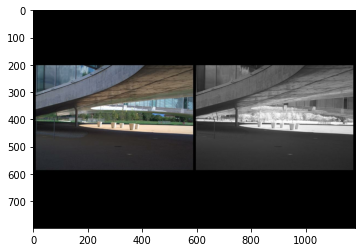

In [4]:
#plotting 1 image and its info
for image in training_ds.take(1):
  print(f"image shape: {image.shape}")
  print(f"image max value: {np.max(image)}, min value: {np.min(image)}")
  print(f"image data type: {image.dtype}")
  plt.imshow(tf.cast(image,"int64"))

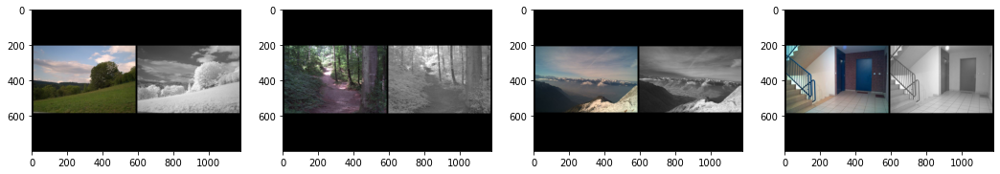

In [5]:
#more images:
fig, arr = plt.subplots(1, 4, figsize=(18, 18))

for index, image in enumerate(training_ds.take(4)):
  arr[index].imshow(tf.cast(image,"int64"))

We see that each element in our dataset is one image that consists of both the IR image and the RGB image, so we will need to crop from it two separate images.

Some functions to preprocess the dataset:

In [6]:
# The training set consist of 407 images
BUFFER_SIZE = 407
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image should be 256x256 to match the models
IMG_WIDTH = 256
IMG_HEIGHT = 256

#splits each image to the rgb image and the IR image
def split_images(image):
  rgb = image[202:585, 10:586, :]
  IR = image[202:585, 596:1172, :]
  # Convert both images to float32 tensors
  rgb = tf.cast(rgb, tf.float32)
  IR = tf.cast(IR, tf.float32)

  return IR , rgb

def show_lab_images(real , IR):
  L = real[:,:,:1] * 50 + 50
  ab = real[:,:,1:] * 110
  real = tf.concat([L,ab],axis=-1)
  real = tfio.experimental.color.lab_to_rgb(real)
  IR = IR * 0.5 + 0.5
  fig, arr = plt.subplots(1, 2, figsize=(14, 10))
  arr[0].imshow(real)
  arr[0].set_title('RGB Image')
  arr[1].imshow(IR, cmap="gray")
  arr[1].set_title('IR Image')


def normalize_rgb(input_image, real_image):
  # Normalizing the images to [0 , 1]
  input_image = input_image / 255.0
  real_image = real_image / 255.0

  return input_image, real_image


def normalize_lab(input_image, real_image):
  # Normalizing the images to [-1 , 1]
  input_image = input_image * 2 - 1
  L = real_image[:,:,:1] / 50 - 1
  ab = real_image[:,:,1:] / 110
  real_image = tf.concat([L,ab],axis=-1)
  return input_image, real_image

def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

#Building the input pipeline

In [7]:
def load_image(image_file):
  input_image, real_image = split_images(image_file)
  input_image, real_image = resize(input_image, real_image, IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize_rgb(input_image, real_image)
  real_image = tfio.experimental.color.rgb_to_lab(real_image) 
  input_image, real_image = normalize_lab(input_image, real_image)
  input_image = tf.reshape(input_image[...,0],[IMG_HEIGHT, IMG_WIDTH,1])
  return input_image, real_image

In [8]:
training_ds = training_ds.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
training_ds = training_ds.cache()
training_ds = training_ds.shuffle(BUFFER_SIZE)
training_ds = training_ds.batch(BATCH_SIZE)
training_ds = training_ds.prefetch(tf.data.AUTOTUNE)

validation_ds = validation_ds.map(load_image)
validation_ds = validation_ds.batch(BATCH_SIZE)

checking again to ensure correct form of the images:

shape of the color image: (1, 256, 256, 3)
shape of IR image: (1, 256, 256, 1)
color image; max value: 0.9990088939666748 , min value: -0.9992085099220276
IR image; max value: 1.0 , min value: -0.8352941274642944


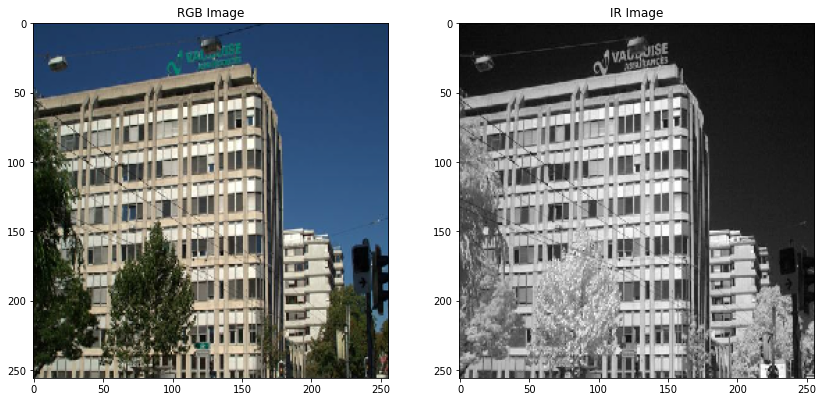

In [9]:
for IR , lab in training_ds.take(1):
  print(f"shape of the color image: {lab.shape}")
  print(f"shape of IR image: {IR.shape}")
  print(f"color image; max value: {np.max(lab)} , min value: {np.min(lab)}")
  print(f"IR image; max value: {np.max(IR)} , min value: {np.min(IR)}")
  show_lab_images(tf.squeeze(lab), tf.squeeze(IR))

# Building the generator
functions for building the generator:

In [10]:
OUTPUT_CHANNELS = 2 #The generator will only predict the ab channels.

def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [11]:
#testing cell

test_image = IR
down_model = downsample(3, 4)
down_result = down_model(test_image)
print (down_result.shape)

up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 128, 128, 3)
(1, 256, 256, 3)


Creating the Generator:

In [12]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 1]) #to match our images

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [13]:
generator = Generator()
#generator.summary()

In [14]:
#tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

The shape of the input: (1, 256, 256, 1)
The shape of the output: (1, 256, 256, 2)


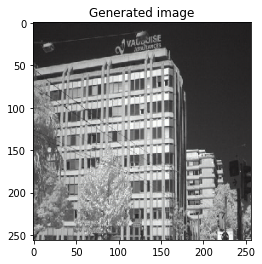

In [15]:
#testing cell

print(f"The shape of the input: {test_image.shape}")                      
gen_output = generator(test_image  , training=False)
print(f"The shape of the output: {gen_output.shape}")

L = test_image[0] * 50 + 50
ab = gen_output[0] * 110
generated = tf.concat([L,ab],axis=-1)
generated = tfio.experimental.color.lab_to_rgb(generated)

plt.title("Generated image")
plt.imshow(generated)

In [16]:
LAMBDA = 100
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

#Building the discriminator
Creating the Discriminator:

In [17]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 1], name='input_image') # IR image got 1 channel only
  tar = tf.keras.layers.Input(shape=[256, 256, 2], name='target_image') # ab channels

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, [IR,a,b] )

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

In [18]:
discriminator = Discriminator()
#tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

(1, 30, 30, 1)


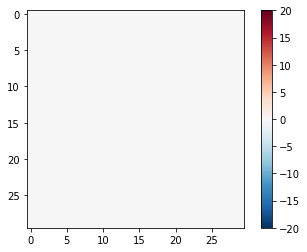

In [19]:
#testing cell
disc_out = discriminator([test_image, gen_output], training=False)
print(disc_out.shape)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

In [20]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output) - tf.random.uniform(shape = disc_real_output.shape, maxval=0.1), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output) + tf.random.uniform(shape = disc_generated_output.shape, maxval=0.1), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

Optimizers for the generator and the discriminator:

In [21]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

checkpoints (just to save the models later):

In [22]:
checkpoint_dir = '/content/drive/MyDrive/IR dataset/IR project/checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

function to plot the triplet:

*   input (IR image)
*   target (rgb image)
*   prediction (generated rgb image from the IR image)

In [23]:
def generate_images(model, test_input, tar):
  #real image:
  L= tar[0,:,:,:1]* 50 + 50
  ab = tar[0,:,:,1:] * 110
  real = tf.concat([L,ab],axis=-1)
  real = tfio.experimental.color.lab_to_rgb(real)
  
  #IR image:
  IR = tf.squeeze(test_input) * 0.5 +0.5
  
  #generated image:
  prediction = model(test_input, training=True)
  generated_ab = prediction[0] * 110
  generated_L = test_input[0] * 50 + 50
  generated_image = tf.concat([generated_L,generated_ab],axis=-1)
  generated_image = tfio.experimental.color.lab_to_rgb(generated_image)
  
  plt.figure(figsize=(18, 18))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']
  plt.subplot(1,3,1)
  plt.title("IR image (Input)")
  plt.imshow(IR, cmap="gray")
  plt.axis('off')
  
  plt.subplot(1,3,2)
  plt.title('Real Colored Image (Ground Truth)')
  plt.imshow(real)
  plt.axis('off')

  plt.subplot(1,3,3)
  plt.title('Generated Colored Image (Prediction)')
  plt.imshow(generated_image)
  plt.axis('off')
  
  plt.show()

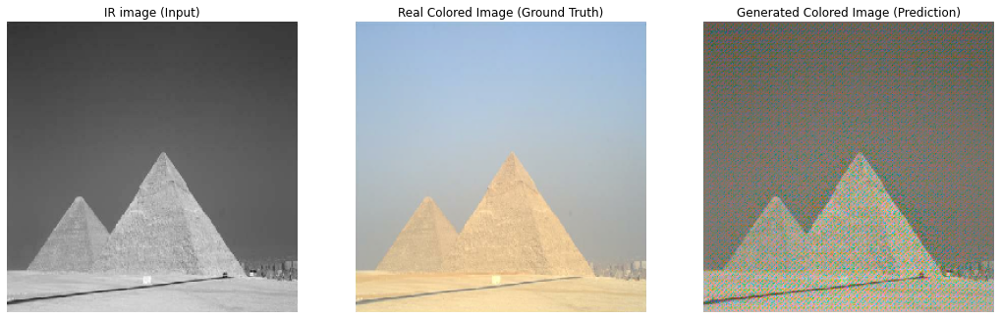

In [24]:
#testing the above function
for example_input, example_target in training_ds.take(1):
  generate_images(generator, example_input, example_target)

#Training


In [25]:
@tf.function
def train_step(input_image, target, step):
  target = target[:,:,:,1:] #we only predict the ab channels
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

In [26]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()
  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()
      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

Running the training loop:

In [27]:
#THE TRAINING CELL, UNCOMMENT THE LINE BELOW TO TRAIN THE GAN

#fit(training_ds, validation_ds, steps=20000)

#Testing the results
Running the generator on few examples from the validation set:

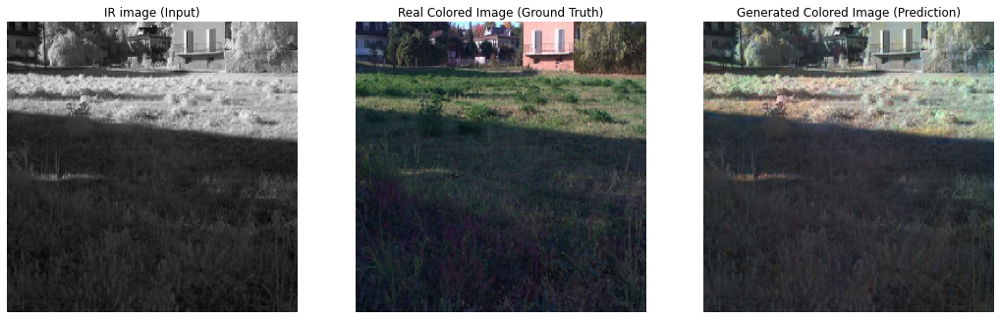

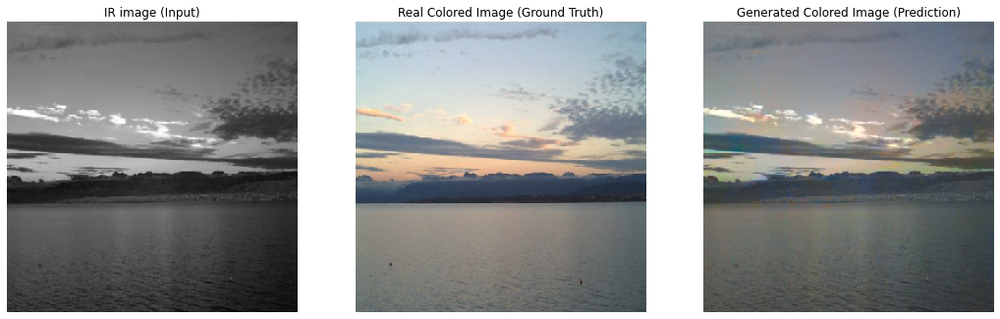

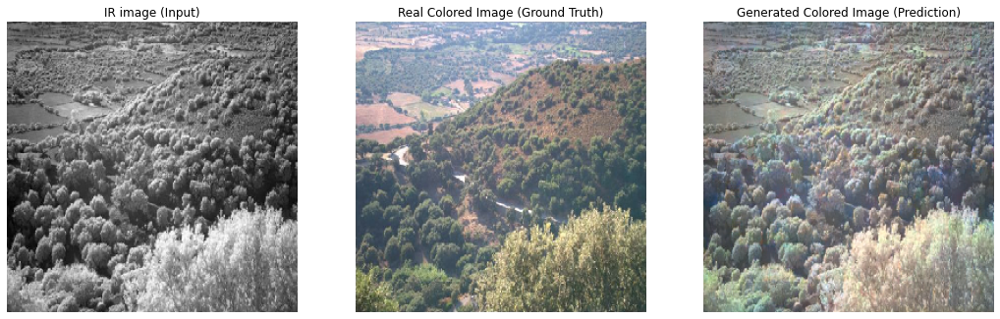

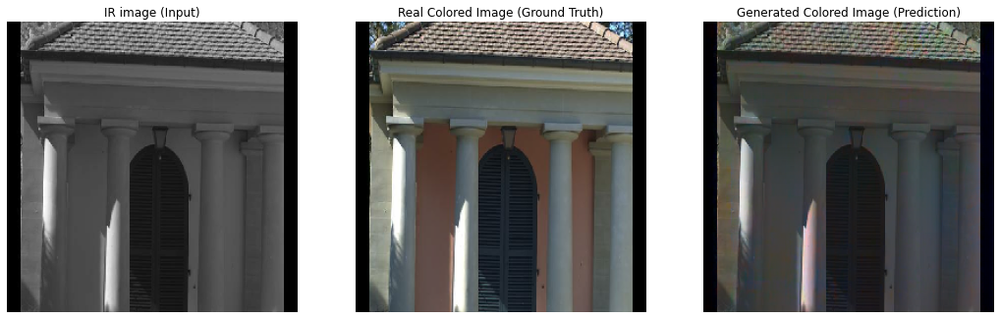

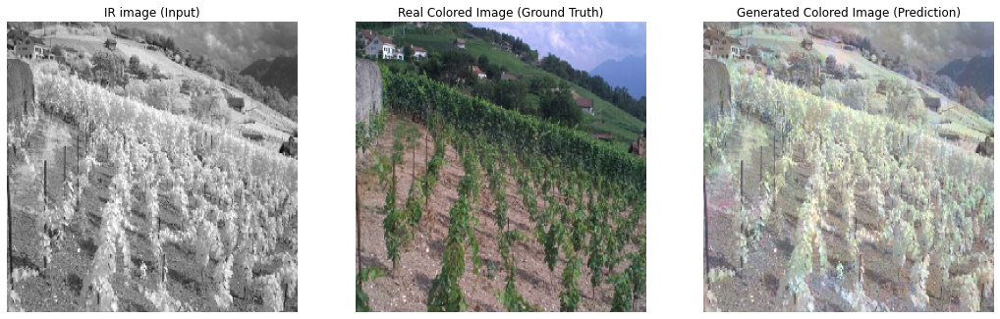

...

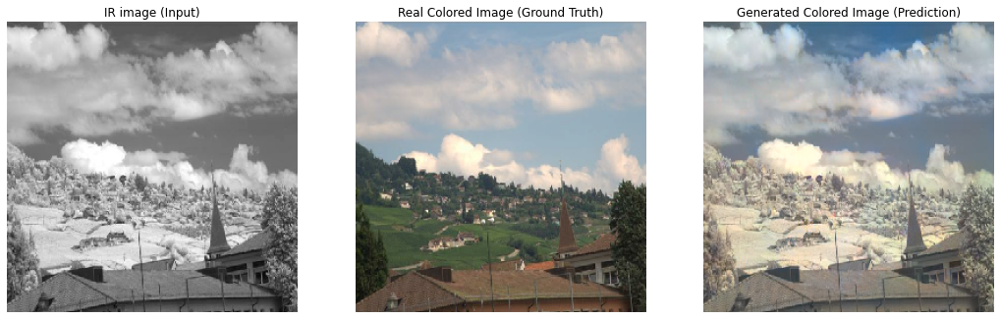

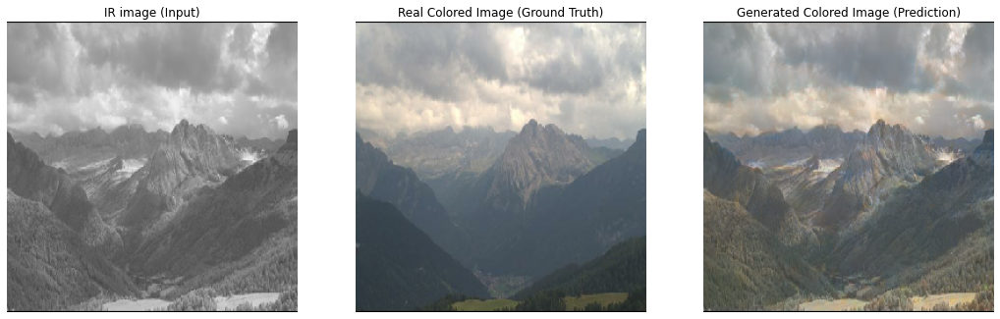

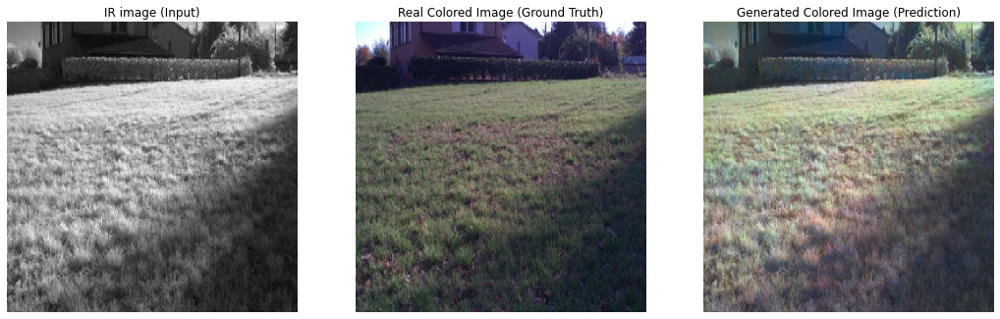

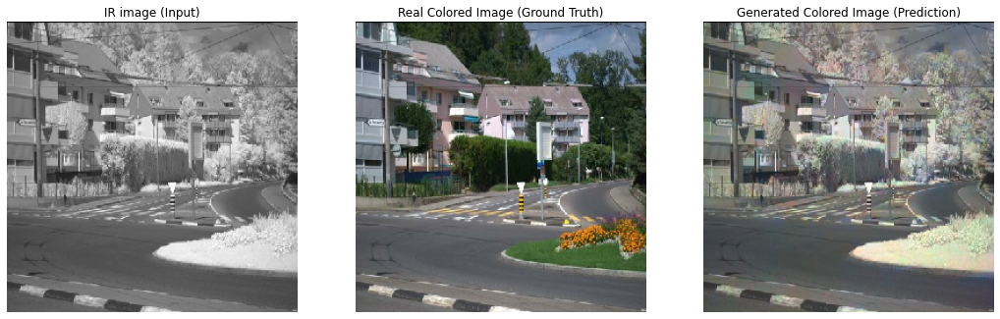

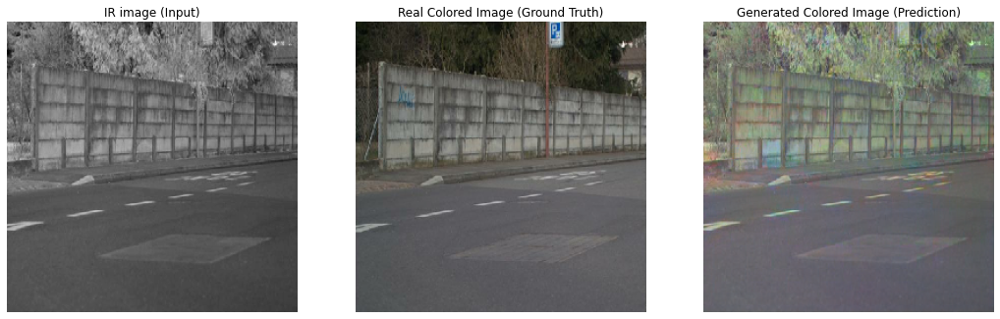

In [33]:
for example_input, example_target in validation_ds.take(20):
  generate_images(generator, example_input, example_target)

In [29]:
# save the progress (uncomment the line below)

#checkpoint.save(file_prefix=checkpoint_prefix)

In [31]:
#load checkpoint (uncomment the line below)

#checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))


#Summary
* The model was trained for 28k steps in total (about 76 epochs).

* The colors in the generated images seem more or less reasonable except for the color of the vegetation which is more prone to yellow rather than green. Perhaps a longer training session would solve the problem because the phenomenon appeared also in the training set. The colors are also less "vivid" compared to the original image.

* The dataset contained too few images and was not colorful enough. 
*The IR images were not taken at exactly the same time as the color images, so there were differences between the images. (For example, we can see a car in the IR image which is already gone on the RGB image). From the original dataset, I deleted 70 images (which is 15% of all images) where the differences between the images were too significant, however, the rest of the images still have small differences (between the IR and RGB images) that probably hurt the model results.

* The training is quite slow, for every thousand steps it takes 1.5 to 3 minutes (with GPU), and it takes about 20 - 40 thousand steps for the training.  so, it is difficult to train several times to test different sets of hyperparameters.

#Next steps:
* Other image coloring models on the internet are based on the same principle (predicting the ab channels from the L channel) but have been trained on a much larger dataset. we can try to take such a model and use it instead of the model I trained.

* The method I used: Treating the IR image as if it was the L channel of the color image (i.e. the grayscale version of the color image) is incorrect for the purpose of restoring the original image. Although these two images (the IR and the L channel) are in grayscale, they are not exactly the same. While many parts are indeed dark or light in the two images respectively, some parts appear dark in the L channel but in the IR image, they are actually light (usually it is the vegetation: grass, trees, etc.). It is therefore not certain whether the use of a model trained on coloring the L-channel would be appropriate for trying to predict the original color image from the IR image.

* Maybe a better way is to train a model that predicts the L-channel of the original image from the IR image (single-channel input and single-channel output), and then, on that generated L channel we can apply the coloring models to try to predict the original color image.

